In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# <B><ins>Installing Dependencies</ins></B>

In [2]:
! apt-get install git && pip install tensorflow_addons

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
git is already the newest version (1:2.34.1-1ubuntu1.10).
0 upgraded, 0 newly installed, 0 to remove and 19 not upgraded.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 612.3/612.3 kB 8.7 MB/s eta 0:00:00


In [83]:
!rm --recursive --force "./DashtoonAssignment" || true && git clone https://github.com/Obliquedbishop/DashtoonAssignment.git

Cloning into 'DashtoonAssignment'...
remote: Enumerating objects: 52, done.
remote: Counting objects: 100% (52/52), done.
remote: Compressing objects: 100% (38/38), done.
remote: Total 52 (delta 11), reused 44 (delta 6), pack-reused 0
Receiving objects: 100% (52/52), 12.19 MiB | 19.75 MiB/s, done.
Resolving deltas: 100% (11/11), done.


# <B><ins>Downloading COCO Dataset</ins></B>

In [14]:
import os

coco_path = "./drive/MyDrive/coco"
zip_url_train = "http://images.cocodataset.org/zips/train2017.zip"
zip_url_val = "http://images.cocodataset.org/zips/val2017.zip"
zip_url_ann = "http://images.cocodataset.org/annotations/annotations_trainval2017.zip"
zip_file_path_train = os.path.join(coco_path, "coco_train2017.zip")
zip_file_path_val = os.path.join(coco_path, "coco_val2017.zip")
zip_file_path_ann = os.path.join(coco_path, "coco_ann2017.zip")
# Check if the folder exists
if not os.path.exists(coco_path):
    print("Downloading coco dataset 2017...")
    os.makedirs(coco_path, exist_ok=True)
    os.system(f"wget {zip_url_train} -O {zip_file_path_train}")
    os.system(f"wget {zip_url_val} -O {zip_file_path_val}")
    os.system(f"wget {zip_url_ann} -O {zip_file_path_ann}")
else:
    print("Folder already exists. Skipping download.")


Folder already exists. Skipping download.


# <B><ins> Importing Libraries</ins></B>

In [16]:
import numpy as np
import PIL
import PIL.Image as Image
import json
import time
import itertools
import sys
import requests
from zipfile import ZipFile, BadZipFile
from pathlib import Path
import matplotlib.pyplot as plt

In [17]:
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.applications import vgg16
import tensorflow_addons as tfa
from tensorflow.keras import mixed_precision
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# <B><ins>Setting training environment</ins></B>

In [18]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' # disable tensorflow debugging logs

gpus = tf.config.experimental.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(gpus[0], True)

AUTOTUNE = tf.data.experimental.AUTOTUNE
policy = mixed_precision.Policy('mixed_float16')
mixed_precision.set_global_policy(policy)

# <B><ins>Creating Image Transformation Network and Loss Network</ins></B>

In [13]:
class ConvReflect(tf.keras.layers.Layer):
    # 2D Convolution layer with reflection padding
    def __init__(self, filters, kernel_size, strides=(1, 1),
                 activation=None,
                 kernel_initializer='glorot_normal'):
        super(ConvReflect, self).__init__()
        self.size_pad = kernel_size // 2
        self.padding = tf.constant([[0, 0],
                                    [self.size_pad, self.size_pad],
                                    [self.size_pad, self.size_pad],
                                    [0, 0]])
        self.conv2d = layers.Conv2D(filters, kernel_size, strides,
                                    activation=activation,
                                    kernel_initializer=kernel_initializer)

    def call(self, x):
        x = tf.pad(x, self.padding, 'REFLECT')
        return self.conv2d(x)

In [19]:
def ImageTransformNet(input_shape=(256, 256, 3), residual_layers=5,
                      residual_filters=128, initializer='glorot_normal'):
    inputs = tf.keras.Input(shape=input_shape)

    # Normalize the values to [-1, 1]
    x = layers.Rescaling(scale=1./127.5, offset=-1)(inputs)

    x = ConvReflect(32, 9, kernel_initializer=initializer)(x)
    x = tfa.layers.InstanceNormalization(axis=3, center=True,
                                         scale=True,
                                         beta_initializer=initializer,
                                         gamma_initializer=initializer)(x)
    x = layers.Activation('relu')(x)

    x = ConvReflect(64, 3, strides=2, kernel_initializer=initializer)(x)
    x = tfa.layers.InstanceNormalization(axis=3, center=True,
                                         scale=True,
                                         beta_initializer=initializer,
                                         gamma_initializer=initializer)(x)
    x = layers.Activation('relu')(x)

    x = ConvReflect(residual_filters, 3, strides=2,
                    kernel_initializer=initializer)(x)
    x = tfa.layers.InstanceNormalization(axis=3, center=True,
                                         scale=True,
                                         beta_initializer=initializer,
                                         gamma_initializer=initializer)(x)
    x = layers.Activation('relu')(x)

    for size in [residual_filters]*residual_layers:
        residual = x
        x = ConvReflect(size, 3, kernel_initializer=initializer)(x)
        x = tfa.layers.InstanceNormalization(axis=3, center=True,
                                             scale=True,
                                             beta_initializer=initializer,
                                             gamma_initializer=initializer)(x)

        x = layers.Activation('relu')(x)

        x = ConvReflect(size, 3, kernel_initializer=initializer)(x)
        x = tfa.layers.InstanceNormalization(axis=3, center=True,
                                             scale=True,
                                             beta_initializer=initializer,
                                             gamma_initializer=initializer)(x)
        x = layers.add([x, residual])  # Add back residual

    x = layers.UpSampling2D(2)(x)
    x = ConvReflect(64, 3, kernel_initializer=initializer)(x)
    x = tfa.layers.InstanceNormalization(axis=3, center=True,
                                         scale=True,
                                         beta_initializer=initializer,
                                         gamma_initializer=initializer)(x)
    x = layers.Activation('relu')(x)

    x = layers.UpSampling2D(2)(x)
    x = ConvReflect(32, 3, kernel_initializer=initializer)(x)
    x = tfa.layers.InstanceNormalization(axis=3, center=True,
                                         scale=True,
                                         beta_initializer=initializer,
                                         gamma_initializer=initializer)(x)
    x = layers.Activation('relu')(x)

    x = ConvReflect(3, 9, kernel_initializer=initializer)(x)
    outputs = layers.Activation('tanh', dtype='float32')(x)

    return tf.keras.Model(inputs, outputs)

In [20]:
class LossNetwork(tf.keras.models.Model):
    def __init__(self, style_layers=None):
        super(LossNetwork, self).__init__()
        if style_layers is None:
            style_layers = ['block1_conv2',
                            'block2_conv2',
                            'block3_conv3',
                            'block4_conv3']
        vgg = vgg16.VGG16(include_top=False, weights='imagenet')
        vgg.trainable = False
        model_outputs = [vgg.get_layer(name).output for name in style_layers]
        self.model = tf.keras.models.Model(vgg.input, model_outputs)
        # mixed precision float32 output
        self.linear = layers.Activation('linear', dtype='float32')

    def call(self, x):
        x = vgg16.preprocess_input(x)
        x = self.model(x)
        return self.linear(x)

In [101]:
hparams = {'input_size': (256, 256, 3),
           'batch_size': 4,
           'content_weight': 7e-6,
           'style_weight': 6e-9,
           'learning_rate': 0.001,
           'residual_filters': 128,
           'residual_layers': 5,
           'initializer': 'glorot_normal',
           'style_layers': ['block1_conv2',
                            'block2_conv2',
                            'block3_conv3',
                            'block4_conv3'],
           'content_layer_index': 2,
           'test_size': (256, 256, 3)
}

# <B><ins>Creating some utility functions</ins></B>

In [72]:
def extract_zip_file(extract_path):
    try:
        with ZipFile(extract_path+".zip") as zfile:
            zfile.extractall(extract_path)
        # remove zipfile
        zfileTOremove=f"{extract_path}"+".zip"
        if os.path.isfile(zfileTOremove):
            os.remove(zfileTOremove)
        else:
            print("Error: %s file not found" % zfileTOremove)
    except BadZipFile as e:
        print("Error:", e)

def deprocess(img):
  img = 255*(img + 1.0)/2.0
  return tf.cast(img, tf.uint8)

def convert(file_path, shape=hparams['input_size'][:2]):
    # Resizing the image to the input size
    img = tf.io.read_file(file_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, shape)
    return img

def tensor_to_image(tensor):
    tensor = deprocess(tensor)
    if np.ndim(tensor)>3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    tensor = tf.image.encode_jpeg(tensor)
    return tensor

def save_hparams(model_name, hparams):
    json_hparams = json.dumps(hparams)
    f = open(os.path.join(model_name, '{}_hparams.json'.format(model_name)), 'w')
    f.write(json_hparams)
    f.close()

# <B><ins>Creating data loaders and loss functions</ins></B>

In [90]:
def gram_matrix(input_tensor):
    input_tensor = tf.cast(input_tensor, tf.float32)
    result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
    input_shape = tf.shape(input_tensor)
    num_locations = tf.cast(input_shape[1]*input_shape[2], tf.float32)
    return result/num_locations

def content_loss(content, output):
    return tf.reduce_mean((content-output)**2)

def style_loss(style, output):
    return tf.add_n([tf.reduce_mean((style_feat-out_feat)**2)
                        for style_feat, out_feat in zip(style, output)])

def create_train_ds(args, hparams):
    train_list_ds = tf.data.Dataset.list_files(str(args["content_dir"] + '*.jpg'), shuffle=True)
    train_len = tf.data.experimental.cardinality(train_list_ds)
    train_images_ds = train_list_ds.map(convert, num_parallel_calls=AUTOTUNE)

    print('Total content images: {}'.format(train_len.numpy()))
    ds = train_images_ds.repeat().batch(hparams['batch_size'],
                                        drop_remainder=True,
                                        num_parallel_calls=AUTOTUNE).prefetch(buffer_size=AUTOTUNE)
    return ds

def create_test_batch(args):
    test_list_ds = tf.data.Dataset.list_files(str(train_args["test_img"] + '*.jpg'), shuffle=True)
    test_content_img = []
    for img in test_list_ds:
        test_content_img.append(img.numpy().decode('utf-8').split('/')[-1])
    test_content_batch = tf.concat(
        [convert(os.path.join(args["test_img"], img))[tf.newaxis, :] for img in test_content_img], axis=0)
    return test_content_batch

# <B><ins>Creating the training and testing functions</ins></B>

In [91]:
def run_training(args, hparams):
    it_network = ImageTransformNet(input_shape=hparams['input_size'],
                                   residual_layers=hparams['residual_layers'],
                                   residual_filters=hparams['residual_filters'],
                                   initializer=hparams['initializer'])
    loss_network = LossNetwork(hparams['style_layers'])

    # Using Adam's optimizer
    optimizer = tf.keras.optimizers.Adam(learning_rate=hparams['learning_rate'])
    optimizer = mixed_precision.LossScaleOptimizer(optimizer)

    # Setting checkpoint object of tensorflow for saving the models
    ckpt_dir = os.path.join(args["name"], 'pretrained')
    ckpt = tf.train.Checkpoint(network=it_network,
                               optimizer=optimizer,
                               step=tf.Variable(0))
    ckpt_manager = tf.train.CheckpointManager(ckpt,
                                              directory=ckpt_dir,
                                              max_to_keep=args["max_ckpt_to_keep"])
    # Restoring the latest checkpoint, to resume training from there
    ckpt.restore(ckpt_manager.latest_checkpoint)

    # Creating log directory for tensorboard
    log_dir = os.path.join(args["name"], 'log_dir')
    writer = tf.summary.create_file_writer(logdir=log_dir)

    print('\n####################################################')
    print('Perceptual Losses for Real-Time Style Transfer Train')
    print('####################################################\n')

    if ckpt_manager.latest_checkpoint:
        print('Restored {} from: {}'.format(args["name"], ckpt_manager.latest_checkpoint))
    else:
        print('Initializing {} from scratch'.format(args["name"]))
        save_hparams(args["name"], hparams)
    print('Style image: {}'.format(args["style_img"]))
    print('Start TensorBoard with: $ tensorboard --logdir ./\n')

    total_loss_avg = tf.keras.metrics.Mean()
    style_loss_avg = tf.keras.metrics.Mean()
    content_loss_avg = tf.keras.metrics.Mean()

    save_hparams(args["name"], hparams)

    style_img = convert(args["style_img"])
    target_feature_maps = loss_network(style_img[tf.newaxis, :])
    target_gram_matrices = [gram_matrix(x) for x in target_feature_maps]
    num_style_layers = len(target_feature_maps)

    dataset = create_train_ds(args, hparams)
    test_content_batch = create_test_batch(args)

    @tf.function
    def test_step(batch):
        prediction = it_network(batch, training=False)
        return deprocess(prediction)

    @tf.function
    def train_step(batch):
        with tf.GradientTape() as tape:
            output_batch = it_network(batch, training=True)
            output_batch = 255*(output_batch + 1.0)/2.0 # float deprocess

            # Feed target and output batch through loss_network
            target_batch_feature_maps = loss_network(batch)
            output_batch_feature_maps = loss_network(output_batch)

            c_loss = content_loss(target_batch_feature_maps[hparams['content_layer_index']],
                                  output_batch_feature_maps[hparams['content_layer_index']])
            c_loss *= hparams['content_weight']

            # Get output gram_matrix
            output_gram_matrices = [gram_matrix(x) for x in output_batch_feature_maps]
            s_loss = style_loss(target_gram_matrices,
                                output_gram_matrices)
            s_loss *= hparams['style_weight'] / num_style_layers

            total_loss = c_loss + s_loss
            scaled_loss = optimizer.get_scaled_loss(total_loss)

        scaled_gradients = tape.gradient(scaled_loss, it_network.trainable_variables)
        gradients = optimizer.get_unscaled_gradients(scaled_gradients)
        optimizer.apply_gradients(zip(gradients, it_network.trainable_variables))

        total_loss_avg(total_loss)
        content_loss_avg(c_loss)
        style_loss_avg(s_loss)

    total_start = time.time()
    for batch_image in dataset:
        start = time.time()
        train_step(batch_image)

        ckpt.step.assign_add(1)
        step_int = int(ckpt.step) # cast ckpt.step

        if (step_int) % args["ckpt_interval"] == 0:
            print('Time taken for step {} is {} sec'.format(step_int, time.time()-start))
            ckpt_manager.save(step_int)
            prediction_norm = test_step(test_content_batch)

            with writer.as_default():
                tf.summary.scalar('total loss', total_loss_avg.result(), step=step_int)
                tf.summary.scalar('content loss', content_loss_avg.result(), step=step_int)
                tf.summary.scalar('style loss', style_loss_avg.result(), step=step_int)
                images = np.reshape(prediction_norm, (-1, hparams['input_size'][0],
                                                          hparams['input_size'][1], 3))
                tf.summary.image('generated image', images, step=step_int,
                                 max_outputs=len(test_content_batch))

            print('Total loss: {:.4f}'.format(total_loss_avg.result()))
            print('Content loss: {:.4f}'.format(content_loss_avg.result()))
            print('Style loss: {:.4f}'.format(style_loss_avg.result()))
            print('Total time: {} sec\n'.format(time.time()-total_start))
            total_loss_avg.reset_states()
            content_loss_avg.reset_states()
            style_loss_avg.reset_states()

In [92]:
def run_test(args, hparams):
    it_network = ImageTransformNet(input_shape=hparams['test_size'],
                                   residual_layers=hparams['residual_layers'],
                                   residual_filters=hparams['residual_filters'])
    ckpt_dir = os.path.join(args["name"], 'pretrained')
    ckpt = tf.train.Checkpoint(network=it_network, step=tf.Variable(0))
    ckpt.restore(tf.train.latest_checkpoint(ckpt_dir)).expect_partial()
    print('\n###################################################')
    print('Perceptual Losses for Real-Time Style Transfer Test')
    print('###################################################\n')
    print('Restored {} step: {}\n'.format(args["name"], str(ckpt.step.numpy())))

    dir_size = 'step_{}_{}x{}'.format(str(ckpt.step.numpy()),
                                      str(hparams['test_size'][0]),
                                      str(hparams['test_size'][1]))
    dir_model = 'output_img_{}'.format(args["name"])
    out_dir = os.path.join(args["output_path"], dir_model, dir_size)

    if not os.path.exists(out_dir):
        os.makedirs(out_dir)

    content_img_list = os.listdir(args["test_content_img"])

    for c_file in content_img_list:
        content = convert(os.path.join(args["test_content_img"], c_file),
                               hparams['test_size'][:2])[tf.newaxis, :]
        output = it_network(content, training=False)
        tensor = tensor_to_image(output)
        c_name = '{}_{}'.format(args["name"], os.path.splitext(c_file)[0])
        extension = ".jpeg"
        c_name += extension
        save_path = os.path.join(out_dir, c_name)
        tf.io.write_file(save_path, tensor)
        print ('Image: {} saved'.format(save_path))


# <B><ins> Training </ins></B>

In [93]:
# Extracting the coco dataset files

if not os.path.exists('./drive/MyDrive/coco/coco_train2017'):
    extract_zip_file("./drive/MyDrive/coco/coco_train2017")

if not os.path.exists('./drive/MyDrive/coco/coco_val2017'):
    extract_zip_file("./drive/MyDrive/coco/coco_val2017")

if not os.path.exists('./drive/MyDrive/coco/coco_ann2017'):
    extract_zip_file("./drive/MyDrive/coco/coco_ann2017")

In [102]:
# Training on the smaller validation set of coco dataset, for faster training
train_args = {
  "content_dir": './drive/MyDrive/coco/coco_val2017/val2017/',
  "style_img": './DashtoonAssignment/images/style_img/woman.jpg',
  "name": 'model',
  "ckpt_interval": 250,
  "max_ckpt_to_keep": 20,
  "test_img": './DashtoonAssignment/images/content_img/'
}

In [103]:
!rm -r model

In [104]:
run_training(train_args, hparams)


####################################################
Perceptual Losses for Real-Time Style Transfer Train
####################################################

Initializing model from scratch
Style image: ./DashtoonAssignment/images/style_img/woman.jpg
Start TensorBoard with: $ tensorboard --logdir ./

Total content images: 5000
Time taken for step 250 is 0.13162827491760254 sec
Total loss: 4.4765
Content loss: 1.9615
Style loss: 2.5150
Total time: 57.92474293708801 sec

Time taken for step 500 is 0.1563429832458496 sec
Total loss: 2.9367
Content loss: 1.7174
Style loss: 1.2193
Total time: 93.54558873176575 sec

Time taken for step 750 is 0.1427462100982666 sec
Total loss: 2.6837
Content loss: 1.6409
Style loss: 1.0428
Total time: 130.3858027458191 sec

Time taken for step 1000 is 0.14543509483337402 sec
Total loss: 2.5295
Content loss: 1.5644
Style loss: 0.9651
Total time: 166.87161445617676 sec

Time taken for step 1250 is 0.15910673141479492 sec
Total loss: 2.3955
Content loss: 1.5

KeyboardInterrupt: ignored

# <B><ins> Testing </ins></B>

In [105]:
test_args = {
    "name": 'model',
    "test_content_img": './DashtoonAssignment/images/content_img/',
    "output_path": './output_images/'
}

In [106]:
!rm -rf output_images

In [107]:
run_test(test_args, hparams)


###################################################
Perceptual Losses for Real-Time Style Transfer Test
###################################################

Restored model step: 6000

Image: ./output_images/output_img_model/step_6000_256x256/model_islas.jpeg saved
Image: ./output_images/output_img_model/step_6000_256x256/model_face.jpeg saved
Image: ./output_images/output_img_model/step_6000_256x256/model_me.jpeg saved
Image: ./output_images/output_img_model/step_6000_256x256/model_mr_bean.jpeg saved
Image: ./output_images/output_img_model/step_6000_256x256/model_chameleon.jpeg saved


In [111]:
!kill $(ps -e | grep 'tensorboard' | awk '{print $1}')

In [112]:
%load_ext tensorboard
%tensorboard --logdir='./model/log_dir'

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

# <B><ins> Example Output for style transfer </ins></B>

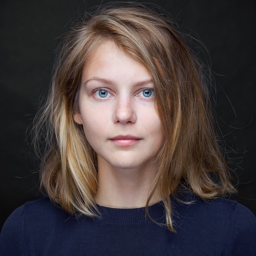

In [123]:
Image.open('./DashtoonAssignment/images/content_img/face.jpg').resize((256, 256))

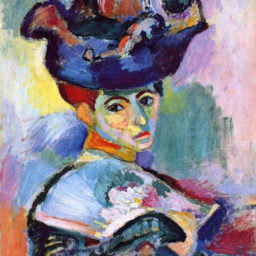

In [124]:
Image.open('./DashtoonAssignment/images/style_img/woman.jpg').resize((256, 256))

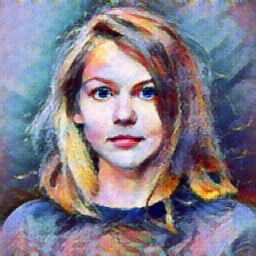

In [117]:
Image.open('./output_images/output_img_model/step_6000_256x256/model_face.jpeg')